In [1]:
%config InlineBackend.figure_formats = ['svg']
%load_ext autoreload
%autoreload 1
%aimport visualization.vis
%aimport utils.utils

In [ ]:

import pytorch_lightning as pl
import cv2
import matplotlib.pyplot as plt
import io


from torch_geometric.loader import DataLoader
from argparse import ArgumentParser
from datasets import ArgoverseV2Dataset
from predictors import QCNet
from predictors.autoval import AntoQCNet
from transforms import TargetBuilder
from av2.datasets.motion_forecasting import scenario_serialization
from av2.datasets.motion_forecasting.data_schema import (
    ArgoverseScenario,
    ObjectType,
    TrackCategory,
)
from av2.map.map_api import ArgoverseStaticMap
from pathlib import Path
from visualization.vis import plot_traj_with_data, plot_traj, generate_video
from utils.utils import get_transform_mat, get_auto_pred, add_new_agent, reward_function

pl.seed_everything(2023, workers=True)

parser = ArgumentParser()
parser.add_argument("--model", type=str, default="QCNet")
parser.add_argument("--root", type=str, default="~/Multi-agent-competitive-environment/datasets")
parser.add_argument("--batch_size", type=int, default=1)
parser.add_argument("--num_workers", type=int, default=8)
parser.add_argument("--pin_memory", type=bool, default=True)
parser.add_argument("--persistent_workers", type=bool, default=True)
parser.add_argument("--accelerator", type=str, default="auto")
parser.add_argument("--devices", type=int, default=1)
parser.add_argument("--ckpt_path", default="~/Multi-agent-competitive-environment/checkpoints/epoch=10-step=274879.ckpt", type=str)
args = parser.parse_args("")

model = {
    "QCNet": AntoQCNet,
}[args.model].load_from_checkpoint(checkpoint_path=args.ckpt_path)

val_dataset = {
    "argoverse_v2": ArgoverseV2Dataset,
}[model.dataset](
    root=args.root,
    split="val",
    transform=TargetBuilder(model.num_historical_steps, model.num_future_steps),
)


2024-07-17 16:06:07.947253: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-17 16:06:08.579408: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Global seed set to 2023
/home/guanren/anaconda3/envs/QCNet/lib/python3.8/site-packages/pytorch_lightning/utilities/migration/utils.py:51: PossibleUserWarning: The loaded checkpoint was produced with Lightning v2.1.1, which is newer than your current Lightning version: v2.0.4
  rank_zero_warn(


In [3]:
dataloader = DataLoader(
    val_dataset[[val_dataset.processed_file_names.index('3856ed37-4a05-4131-9b12-c4f4716fec92'+'.pkl')]],
    # val_dataset[[val_dataset.raw_file_names.index('00a50e9f-63a1-4678-a4fe-c6109721ecba')]],
    # val_dataset[[val_dataset.raw_file_names.index('d1f6b01e-3b4a-4790-88ed-6d85fb1c0b84')]],
    batch_size=args.batch_size,
    shuffle=False,
    num_workers=args.num_workers,
    pin_memory=args.pin_memory,
    persistent_workers=args.persistent_workers,
)

trainer = pl.Trainer(accelerator=args.accelerator, devices=args.devices)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


In [4]:
it = iter(dataloader)
i=0

/home/guanren/anaconda3/envs/QCNet/lib/python3.8/site-packages/torch_geometric/data/collate.py:145: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  storage = elem.storage()._new_shared(numel)


/home/guanren/qcnet/Multi-agent-competitive-environment/datasets/val/raw/3856ed37-4a05-4131-9b12-c4f4716fec92/scenario_3856ed37-4a05-4131-9b12-c4f4716fec92.parquet
3472.9084636162365 3610.846881758126 387.12422795425374 512.7533453801359


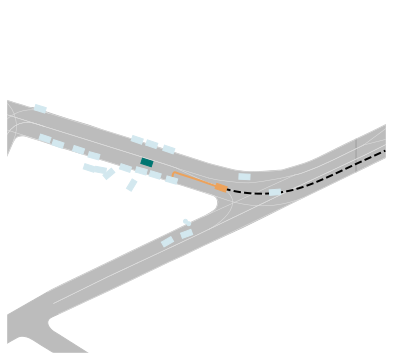

In [5]:

data = next(it, None)
scenario_id = data["scenario_id"][0]
argoverse_scenario_dir = Path("~/Multi-agent-competitive-environment/datasets/val/raw")

all_scenario_files = sorted(argoverse_scenario_dir.rglob(f"*_{scenario_id}.parquet"))
scenario_file_list = list(all_scenario_files)
scenario_path = scenario_file_list[0]
print(scenario_path)

static_map_path = scenario_path.parents[0] / f"log_map_archive_{scenario_id}.json"

scenario = scenario_serialization.load_argoverse_scenario_parquet(scenario_path)
scenario_static_map = ArgoverseStaticMap.from_json(static_map_path)
plot_traj(scenario_static_map,scenario)

In [107]:

for param in model.encoder.parameters():
        param.requires_grad = False
for param in model.decoder.parameters():
        param.requires_grad = False

from torch_geometric.data import Batch
from utils import wrap_angle
import torch, math
import copy
import numpy as np

if isinstance(data, Batch):
    data['agent']['av_index'] += data['agent']['ptr'][:-1]

tensor([[5070.8999, 3009.4485],
        [5070.2734, 3010.0493],
        [5069.6416, 3010.6545],
        [5069.0054, 3011.2610],
        [5068.3701, 3011.8647],
        [5067.7290, 3012.4744],
        [5067.0830, 3013.0876],
        [5066.4351, 3013.7029],
        [5065.7861, 3014.3188],
        [5065.1377, 3014.9355],
        [5064.4819, 3015.5588],
        [5063.8193, 3016.1892],
        [5063.1484, 3016.8274],
        [5062.4751, 3017.4690],
        [5061.7998, 3018.1150],
        [5061.1226, 3018.7668],
        [5060.4438, 3019.4229],
        [5059.7642, 3020.0806],
        [5059.0801, 3020.7434],
        [5058.3921, 3021.4106],
        [5057.7021, 3022.0808],
        [5057.0132, 3022.7529],
        [5056.3276, 3023.4253],
        [5055.6392, 3024.1057],
        [5054.9575, 3024.7876],
        [5054.2900, 3025.4656],
        [5053.6240, 3026.1499],
        [5052.9727, 3026.8274],
        [5052.3306, 3027.5068],
        [5051.7002, 3028.1865],
        [5051.0850, 3028.8669],
        

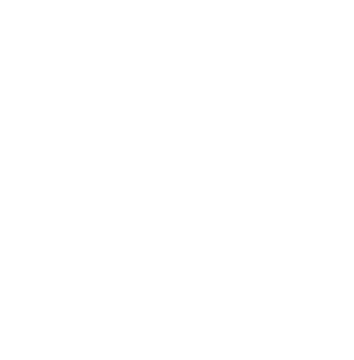

In [108]:
plot_traj_with_data(data,scenario_static_map,1,5,t=50)
agent_index = torch.nonzero(data['agent']['category']==3,as_tuple=False).item()
print(data['agent']['position'][agent_index,50:,:2])
print(data['agent']['heading'][agent_index,50:])

In [136]:
vid_path = "rebuttal2.webm"
generate_video(new_input_data,scenario_static_map, model, vid_path)

tensor([[5.1076, 5.1549, 5.1336, 5.2025, 5.1795, 5.2496]], device='cuda:0')
tensor([[9.6177, 9.6570, 9.6443, 9.7291, 9.6713, 9.7719]], device='cuda:0')
tensor([[14.3438, 14.3592, 14.3309, 14.4178, 14.3650, 14.4623]],
       device='cuda:0')
tensor([[19.0326, 19.0566, 19.0363, 19.0928, 19.0712, 19.1444]],
       device='cuda:0')
tensor([[23.5925, 23.6329, 23.6109, 23.6893, 23.6406, 23.7086]],
       device='cuda:0')
tensor([[28.1151, 28.1739, 28.1183, 28.2001, 28.1920, 28.2401]],
       device='cuda:0')
tensor([[32.7828, 32.7837, 32.7549, 32.8004, 32.8109, 32.8281]],
       device='cuda:0')
tensor([[37.3873, 37.4179, 37.3951, 37.4495, 37.4503, 37.4726]],
       device='cuda:0')
tensor([[42.0617, 42.0286, 42.0397, 42.0665, 42.0811, 42.1087]],
       device='cuda:0')
tensor([[46.7852, 46.8110, 46.8387, 46.8383, 46.8755, 46.8821]],
       device='cuda:0')
tensor([[51.5946, 51.7290, 51.7331, 51.7293, 51.7970, 51.8283]],
       device='cuda:0')
tensor([[56.7319, 56.7679, 56.8038, 56.8383, 56

OpenCV: FFMPEG: tag 0x30385056/'VP80' is not supported with codec id 139 and format 'webm / WebM'


/tmp/ipykernel_269589/1622738850.py:243: MatplotlibDeprecationWarning: Passing the angle parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  vehicle_bounding_box = Rectangle(


IndexError: The shape of the mask [29] at index 0 does not match the shape of the indexed tensor [30, 6, 60, 4] at index 0

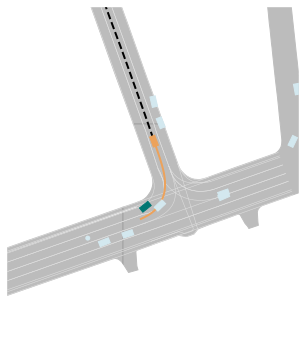

In [ ]:
plot_traj(50.0)
for i in range(6):
    xy = true_traj_refine[[data["agent"]["category"] == 2]][0].cpu().detach()
    plt.plot(xy[i, ..., 0], xy[i, ..., 1])
# for i in range(6):
#     xy = new_position[1][data["agent"]["category"] == 3][0].cpu().detach()
#     plt.plot(xy[i, ..., 0], xy[i, ..., 1])


In [ ]:
[x.value for x in _STATIC_OBJECT_TYPES]

In [ ]:
from PIL import Image

image_paths = [
    '/home/guanren/Multi-agent-competitive-environment/results/scenario1_cce.jpg', 
    '/home/guanren/Multi-agent-competitive-environment/results/scenario2_cce.jpg', 
    '/home/guanren/Multi-agent-competitive-environment/results/scenario3_cce.jpg', 
    '/home/guanren/Multi-agent-competitive-environment/results/scenario4_cce.jpg'
]

crop_percentage = 0.6

space_between = 10

images = [Image.open(x) for x in image_paths]

cropped_images = []
for img in images:
    width, height = img.size
    new_width = int(width * crop_percentage)
    new_height = int(height * crop_percentage)
    left = (width - new_width) // 2
    top = (height - new_height) // 2
    right = (width + new_width) // 2
    bottom = (height + new_height) // 2
    cropped_img = img.crop((left, top, right, bottom))
    cropped_images.append(cropped_img)

total_width = sum(img.width for img in cropped_images) + space_between * (len(cropped_images) - 1)
max_height = max(img.height for img in cropped_images)

new_image = Image.new('RGB', (total_width, max_height), 'white')


x_offset = 0
for img in cropped_images:
    new_image.paste(img, (x_offset, 0))
    x_offset += img.width + space_between

new_image.save('./results/scenario-cce.jpg')


/tmp/ipykernel_10977/55090998.py:67: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
  return image.resize(size, resample = Image.BICUBIC)
/tmp/ipykernel_10977/55090998.py:70: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
  return image.resize(size, resample = Image.BICUBIC)


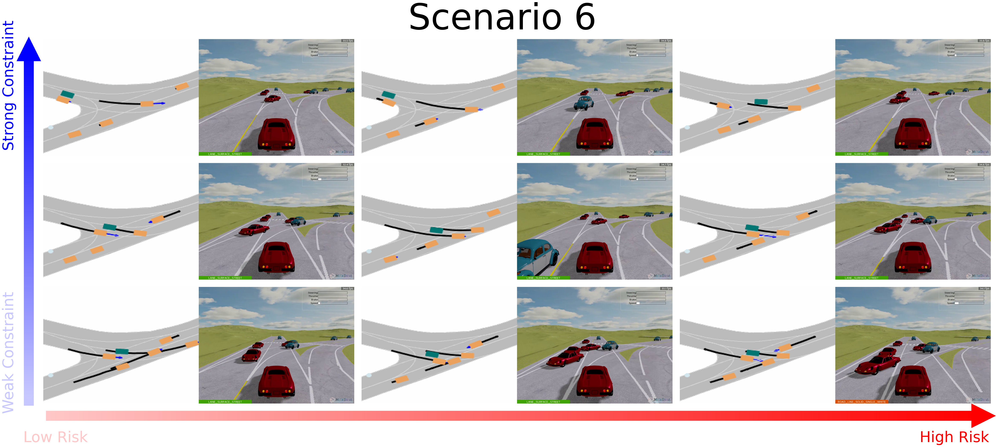

In [17]:
from PIL import ImageDraw, ImageFont, Image
import imageio
import matplotlib.pyplot as plt
import cv2

scenario_id = 6

def draw_gradient_arrow(image, orientation='horizontal', color1=(255, 0, 0), color2=(0, 0, 255), start_pos=(0, 0), length=300, arrow_width=40, arrow_head_size=20):
    draw = ImageDraw.Draw(image)
    if orientation == 'horizontal':
        for i in range(length):
            r = color1[0] + (color2[0] - color1[0]) * i // length
            g = color1[1] + (color2[1] - color1[1]) * i // length
            b = color1[2] + (color2[2] - color1[2]) * i // length
            draw.line([(start_pos[0] + i, start_pos[1]), (start_pos[0] + i, start_pos[1] + arrow_width)], fill=(r, g, b), width=arrow_width)
        # Draw the arrowhead
        arrowhead_pos = (start_pos[0] + length, start_pos[1] + arrow_width // 2)
        draw.polygon([arrowhead_pos, 
                      (arrowhead_pos[0] - arrow_head_size, arrowhead_pos[1] - arrow_head_size), 
                      (arrowhead_pos[0] - arrow_head_size, arrowhead_pos[1] + arrow_head_size)], 
                      fill=color2)
    elif orientation == 'vertical':
        for i in range(length):
            r = color1[0] + (color2[0] - color1[0]) * i // length
            g = color1[1] + (color2[1] - color1[1]) * i // length
            b = color1[2] + (color2[2] - color1[2]) * i // length
            draw.line([(start_pos[0] + arrow_width, start_pos[1] + i), (start_pos[0], start_pos[1] + i)], fill=(r, g, b), width=arrow_width)
        # Draw the arrowhead
        arrowhead_pos = (start_pos[0] + arrow_width // 2, start_pos[1] + length)
        draw.polygon([arrowhead_pos, 
                      (arrowhead_pos[0] - arrow_head_size, arrowhead_pos[1] - arrow_head_size), 
                      (arrowhead_pos[0] + arrow_head_size, arrowhead_pos[1] - arrow_head_size)], 
                      fill=color2)


def get_last_frame_gif(file_path):
    try:
        with imageio.get_reader(file_path) as reader:
            num_frames = reader.get_length()
            last_frame = reader.get_data(num_frames - 1)
            last_frame_image = Image.fromarray(last_frame)
            return last_frame_image
    except EOFError:
        print(f"Error reading the last frame of {file_path}.")
        return None

def get_last_frame_mp4(file_path):
    try:
        cap = cv2.VideoCapture(file_path)
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        cap.set(cv2.CAP_PROP_POS_FRAMES, total_frames - 1)
        ret, frame = cap.read()
        if ret:
            last_frame_image = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            cap.release()
            return last_frame_image
    except Exception as e:
        print(f"Error reading the last frame of {file_path}: {e}")
        return None

def resize_image1(image, size):
    left = 300  # x-coordinate of the left edge of the region
    top = 150   # y-coordinate of the top edge of the region
    right = 500 # x-coordinate of the right edge of the region
    bottom = 350 # y-coordinate of the bottom edge of the region
    image = image.crop((left, top, right, bottom))
    return image.resize(size, resample = Image.BICUBIC)

def resize_image2(image, size):
    return image.resize(size, resample = Image.BICUBIC)

# gif_files = [ './sce_vis/scenario1/scenario-1-piv_1.0-dl_5.0-seed_123-quantile56.gif',
#              './sce_vis/scenario1/scenario-1-piv_1.0-dl_5.0-seed_123-quantile32.gif',
#              './sce_vis/scenario1/scenario-1-piv_1.0-dl_5.0-seed_123-quantile8.gif',
#              './sce_vis/scenario1/scenario-1-piv_1.0-dl_3.0-seed_123-quantile56.gif', 
#              './sce_vis/scenario1/scenario-1-piv_1.0-dl_3.0-seed_123-quantile32.gif', 
#              './sce_vis/scenario1/scenario-1-piv_1.0-dl_3.0-seed_123-quantile8.gif',
#             './sce_vis/scenario1/scenario-1-piv_1.0-dl_2.0-seed_123-quantile56.gif', 
#              './sce_vis/scenario1/scenario-1-piv_1.0-dl_2.0-seed_666-quantile32.gif', 
#              './sce_vis/scenario1/scenario-1-piv_1.0-dl_2.0-seed_123-quantile8.gif', ]
# mp4_files = ['./sce_vis/scenario1/d1f6b01e-3b4a-4790-88ed-6d85fb1c0b84_distance_limit5.0_penalty_initial_value1.0_cost_quantile56_seed123_video_2024-08-22_14-52-56/1_interface.mp4',
#              './sce_vis/scenario1/d1f6b01e-3b4a-4790-88ed-6d85fb1c0b84_distance_limit5.0_penalty_initial_value1.0_cost_quantile32_seed123_video_2024-08-22_14-48-50/1_interface.mp4',
#              './sce_vis/scenario1/d1f6b01e-3b4a-4790-88ed-6d85fb1c0b84_distance_limit5.0_penalty_initial_value1.0_cost_quantile8_seed123_video_2024-08-22_14-49-25/1_interface.mp4',
#              './sce_vis/scenario1/d1f6b01e-3b4a-4790-88ed-6d85fb1c0b84_distance_limit3.0_penalty_initial_value1.0_cost_quantile56_seed123_video_2024-08-22_14-50-02/1_interface.mp4',
#              './sce_vis/scenario1/d1f6b01e-3b4a-4790-88ed-6d85fb1c0b84_distance_limit3.0_penalty_initial_value1.0_cost_quantile32_seed123_video_2024-08-22_14-51-40/1_interface.mp4',
#              './sce_vis/scenario1/d1f6b01e-3b4a-4790-88ed-6d85fb1c0b84_distance_limit3.0_penalty_initial_value1.0_cost_quantile8_seed123_video_2024-08-22_14-51-03/1_interface.mp4',
#              './sce_vis/scenario1/d1f6b01e-3b4a-4790-88ed-6d85fb1c0b84_distance_limit2.0_penalty_initial_value1.0_cost_quantile56_seed123_video_2024-08-22_14-52-18/1_interface.mp4',
#              './sce_vis/scenario1/d1f6b01e-3b4a-4790-88ed-6d85fb1c0b84_distance_limit2.0_penalty_initial_value1.0_cost_quantile32_seed666_video_2024-08-22_14-48-14/1_interface.mp4',
#              './sce_vis/scenario1/d1f6b01e-3b4a-4790-88ed-6d85fb1c0b84_distance_limit2.0_penalty_initial_value1.0_cost_quantile8_seed123_video_2024-08-22_14-50-27/1_interface.mp4',
#              ]

# gif_files = ['./sce_vis/scenario2/scenario-2-piv_1.0-dl_6.0-seed_666-quantile8.gif',
#              './sce_vis/scenario2/scenario-2-piv_1.0-dl_6.0-seed_123-quantile32.gif',
#              './sce_vis/scenario2/scenario-2-piv_1.0-dl_6.0-seed_123-quantile56.gif',
#              './sce_vis/scenario2/scenario-2-piv_1.0-dl_4.0-seed_123-quantile8.gif', 
#              './sce_vis/scenario2/scenario-2-piv_1.0-dl_4.0-seed_123-quantile32.gif', 
#              './sce_vis/scenario2/scenario-2-piv_1.0-dl_4.0-seed_666-quantile56.gif', 
#              './sce_vis/scenario2/scenario-2-piv_1.0-dl_2.0-seed_123-quantile8.gif', 
#              './sce_vis/scenario2/scenario-2-piv_1.0-dl_2.0-seed_321-quantile32.gif', 
#              './sce_vis/scenario2/scenario-2-piv_1.0-dl_2.0-seed_321-quantile56.gif', 
#              ]
# mp4_files = ['./sce_vis/scenario2/00a50e9f-63a1-4678-a4fe-c6109721ecba_distance_limit6.0_penalty_initial_value1.0_cost_quantile56_seed123_video_2024-08-21_16-19-32/1_interface.mp4',
#              './sce_vis/scenario2/00a50e9f-63a1-4678-a4fe-c6109721ecba_distance_limit6.0_penalty_initial_value1.0_cost_quantile32_seed123_video_2024-08-21_16-20-16/1_interface.mp4',
#              './sce_vis/scenario2/00a50e9f-63a1-4678-a4fe-c6109721ecba_distance_limit6.0_penalty_initial_value1.0_cost_quantile8_seed666_video_2024-08-21_16-21-39/1_interface.mp4',
#              './sce_vis/scenario2/00a50e9f-63a1-4678-a4fe-c6109721ecba_distance_limit4.0_penalty_initial_value1.0_cost_quantile56_seed666_video_2024-08-21_16-19-56/1_interface.mp4',
#              './sce_vis/scenario2/00a50e9f-63a1-4678-a4fe-c6109721ecba_distance_limit4.0_penalty_initial_value1.0_cost_quantile32_seed123_video_2024-08-21_16-20-40/1_interface.mp4',
#              './sce_vis/scenario2/00a50e9f-63a1-4678-a4fe-c6109721ecba_distance_limit4.0_penalty_initial_value1.0_cost_quantile8_seed123_video_2024-08-21_16-19-03/1_interface.mp4',
#              './sce_vis/scenario2/00a50e9f-63a1-4678-a4fe-c6109721ecba_distance_limit2.0_penalty_initial_value1.0_cost_quantile56_seed123_video_2024-08-21_16-21-10/1_interface.mp4',
#              './sce_vis/scenario2/00a50e9f-63a1-4678-a4fe-c6109721ecba_distance_limit2.0_penalty_initial_value1.0_cost_quantile32_seed321_video_2024-08-21_16-22-37/1_interface.mp4',
#              './sce_vis/scenario2/00a50e9f-63a1-4678-a4fe-c6109721ecba_distance_limit2.0_penalty_initial_value1.0_cost_quantile8_seed123_video_2024-08-21_16-22-08/1_interface.mp4',
#              ]

# gif_files = ['./sce_vis/scenario3/scenario-3-piv_1.0-dl_5.0-seed_123-quantile56.gif',
#              './sce_vis/scenario3/scenario-3-piv_1.0-dl_5.0-seed_123-quantile32.gif',
#              './sce_vis/scenario3/scenario-3-piv_1.0-dl_5.0-seed_123-quantile8.gif',
#              './sce_vis/scenario3/scenario-3-piv_1.0-dl_3.0-seed_123-quantile56.gif', 
#              './sce_vis/scenario3/scenario-3-piv_1.0-dl_3.0-seed_123-quantile32.gif', 
#              './sce_vis/scenario3/scenario-3-piv_1.0-dl_3.0-seed_123-quantile8.gif', 
#             './sce_vis/scenario3/scenario-3-piv_1.0-dl_2.0-seed_123-quantile56.gif', 
#              './sce_vis/scenario3/scenario-3-piv_1.0-dl_2.0-seed_123-quantile32.gif', 
#              './sce_vis/scenario3/scenario-3-piv_1.0-dl_2.0-seed_123-quantile8.gif', 
#              ]
# mp4_files = ['./sce_vis/scenario3/236df665-eec6-4c25-8822-950a6150eade_distance_limit5.0_penalty_initial_value1.0_cost_quantile56_seed123_video_2024-08-21_16-32-32/1_interface.mp4',
#              './sce_vis/scenario3/236df665-eec6-4c25-8822-950a6150eade_distance_limit5.0_penalty_initial_value1.0_cost_quantile32_seed123_video_2024-08-21_16-33-41/1_interface.mp4',
#              './sce_vis/scenario3/236df665-eec6-4c25-8822-950a6150eade_distance_limit5.0_penalty_initial_value1.0_cost_quantile8_seed123_video_2024-08-21_16-34-14/1_interface.mp4',
#              './sce_vis/scenario3/236df665-eec6-4c25-8822-950a6150eade_distance_limit3.0_penalty_initial_value1.0_cost_quantile56_seed123_video_2024-08-21_16-31-13/1_interface.mp4',
#              './sce_vis/scenario3/236df665-eec6-4c25-8822-950a6150eade_distance_limit3.0_penalty_initial_value1.0_cost_quantile32_seed123_video_2024-08-21_16-34-40/1_interface.mp4',
#              './sce_vis/scenario3/236df665-eec6-4c25-8822-950a6150eade_distance_limit3.0_penalty_initial_value1.0_cost_quantile8_seed123_video_2024-08-21_16-30-33/1_interface.mp4',
#             './sce_vis/scenario3/236df665-eec6-4c25-8822-950a6150eade_distance_limit2.0_penalty_initial_value1.0_cost_quantile56_seed123_video_2024-08-21_16-33-07/1_interface.mp4',
#              './sce_vis/scenario3/236df665-eec6-4c25-8822-950a6150eade_distance_limit2.0_penalty_initial_value1.0_cost_quantile32_seed123_video_2024-08-21_16-35-19/1_interface.mp4',
#              './sce_vis/scenario3/236df665-eec6-4c25-8822-950a6150eade_distance_limit2.0_penalty_initial_value1.0_cost_quantile8_seed123_video_2024-08-21_16-31-54/1_interface.mp4',
#              ]

# gif_files = ['./sce_vis/scenario4/scenario-4-piv_1.0-dl_8.0-seed_666-quantile56.gif',
#              './sce_vis/scenario4/scenario-4-piv_1.0-dl_8.0-seed_123-quantile32.gif',
#              './sce_vis/scenario4/scenario-4-piv_1.0-dl_8.0-seed_666-quantile8.gif',
#              './sce_vis/scenario4/scenario-4-piv_1.0-dl_5.0-seed_666-quantile56.gif',
#              './sce_vis/scenario4/scenario-4-piv_1.0-dl_5.0-seed_321-quantile32.gif',
#              './sce_vis/scenario4/scenario-4-piv_1.0-dl_5.0-seed_666-quantile8.gif',
#             './sce_vis/scenario4/scenario-4-piv_1.0-dl_2.0-seed_123-quantile56.gif',
#              './sce_vis/scenario4/scenario-4-piv_1.0-dl_2.0-seed_123-quantile32.gif',
#              './sce_vis/scenario4/scenario-4-piv_1.0-dl_2.0-seed_123-quantile8.gif',
#              ]
# mp4_files = ['./sce_vis/scenario4/cb0133ff-f7ad-43b7-b260-7068ace15307_distance_limit8.0_penalty_initial_value1.0_cost_quantile56_seed123_video_2024-08-21_16-51-08/1_interface.mp4',
#              './sce_vis/scenario4/cb0133ff-f7ad-43b7-b260-7068ace15307_distance_limit8.0_penalty_initial_value1.0_cost_quantile32_seed123_video_2024-08-21_16-50-14/1_interface.mp4',
#              './sce_vis/scenario4/cb0133ff-f7ad-43b7-b260-7068ace15307_distance_limit8.0_penalty_initial_value1.0_cost_quantile8_seed666_video_2024-08-21_16-49-19/1_interface.mp4',
#              './sce_vis/scenario4/cb0133ff-f7ad-43b7-b260-7068ace15307_distance_limit5.0_penalty_initial_value1.0_cost_quantile56_seed666_video_2024-08-21_16-52-57/1_interface.mp4',
#              './sce_vis/scenario4/cb0133ff-f7ad-43b7-b260-7068ace15307_distance_limit5.0_penalty_initial_value1.0_cost_quantile32_seed321_video_2024-08-21_16-50-40/1_interface.mp4',
#              './sce_vis/scenario4/cb0133ff-f7ad-43b7-b260-7068ace15307_distance_limit5.0_penalty_initial_value1.0_cost_quantile8_seed666_video_2024-08-21_16-49-46/1_interface.mp4',
#             './sce_vis/scenario4/cb0133ff-f7ad-43b7-b260-7068ace15307_distance_limit2.0_penalty_initial_value1.0_cost_quantile56_seed123_video_2024-08-21_16-51-34/1_interface.mp4',
#              './sce_vis/scenario4/cb0133ff-f7ad-43b7-b260-7068ace15307_distance_limit2.0_penalty_initial_value1.0_cost_quantile32_seed123_video_2024-08-21_16-52-29/1_interface.mp4',
#              './sce_vis/scenario4/cb0133ff-f7ad-43b7-b260-7068ace15307_distance_limit2.0_penalty_initial_value1.0_cost_quantile8_seed123_video_2024-08-21_16-52-02/1_interface.mp4',
#              ]

# gif_files = ['./sce_vis/scenario5/scenario-5-piv_5.0-dl_5.0-seed_666-quantile56.gif',
#              './sce_vis/scenario5/scenario-5-piv_5.0-dl_5.0-seed_666-quantile32.gif',
#              './sce_vis/scenario5/scenario-5-piv_5.0-dl_5.0-seed_666-quantile8.gif',
#              './sce_vis/scenario5/scenario-5-piv_5.0-dl_3.0-seed_666-quantile56.gif', 
#              './sce_vis/scenario5/scenario-5-piv_5.0-dl_3.0-seed_666-quantile32.gif', 
#              './sce_vis/scenario5/scenario-5-piv_5.0-dl_3.0-seed_666-quantile8.gif', 
#              './sce_vis/scenario5/scenario-5-piv_5.0-dl_2.0-seed_666-quantile56.gif', 
#              './sce_vis/scenario5/scenario-5-piv_5.0-dl_2.0-seed_666-quantile32.gif', 
#              './sce_vis/scenario5/scenario-5-piv_5.0-dl_2.0-seed_666-quantile8.gif', 
#              ]
# mp4_files = ['./sce_vis/scenario5/cdf70cc8-d13d-470b-bb39-4f1812acc146_distance_limit5.0_penalty_initial_value5.0_cost_quantile56_seed666_video_2024-08-21_17-03-23/1_interface.mp4',
#              './sce_vis/scenario5/cdf70cc8-d13d-470b-bb39-4f1812acc146_distance_limit5.0_penalty_initial_value5.0_cost_quantile32_seed666_video_2024-08-21_17-01-42/1_interface.mp4',
#              './sce_vis/scenario5/cdf70cc8-d13d-470b-bb39-4f1812acc146_distance_limit5.0_penalty_initial_value5.0_cost_quantile8_seed666_video_2024-08-21_17-03-59/1_interface.mp4',
#              './sce_vis/scenario5/cdf70cc8-d13d-470b-bb39-4f1812acc146_distance_limit3.0_penalty_initial_value5.0_cost_quantile56_seed666_video_2024-08-21_17-02-49/1_interface.mp4',
#              './sce_vis/scenario5/cdf70cc8-d13d-470b-bb39-4f1812acc146_distance_limit3.0_penalty_initial_value5.0_cost_quantile32_seed666_video_2024-08-21_17-01-05/1_interface.mp4',
#              './sce_vis/scenario5/cdf70cc8-d13d-470b-bb39-4f1812acc146_distance_limit3.0_penalty_initial_value5.0_cost_quantile8_seed666_video_2024-08-21_17-05-11/1_interface.mp4',
#             './sce_vis/scenario5/cdf70cc8-d13d-470b-bb39-4f1812acc146_distance_limit2.0_penalty_initial_value5.0_cost_quantile56_seed666_video_2024-08-21_17-02-15/1_interface.mp4',
#              './sce_vis/scenario5/cdf70cc8-d13d-470b-bb39-4f1812acc146_distance_limit2.0_penalty_initial_value5.0_cost_quantile32_seed666_video_2024-08-21_17-04-35/1_interface.mp4',
#              './sce_vis/scenario5/cdf70cc8-d13d-470b-bb39-4f1812acc146_distance_limit2.0_penalty_initial_value5.0_cost_quantile8_seed666_video_2024-08-21_17-00-26/1_interface.mp4',
#              ]

gif_files = ['./sce_vis/scenario6/scenario-6-piv_5.0-dl_5.0-seed_123-quantile56.gif',
             './sce_vis/scenario6/scenario-6-piv_5.0-dl_5.0-seed_123-quantile32.gif',
             './sce_vis/scenario6/scenario-6-piv_5.0-dl_5.0-seed_123-quantile8.gif',
             './sce_vis/scenario6/scenario-6-piv_5.0-dl_3.0-seed_123-quantile56.gif', 
             './sce_vis/scenario6/scenario-6-piv_5.0-dl_3.0-seed_123-quantile32.gif', 
             './sce_vis/scenario6/scenario-6-piv_5.0-dl_3.0-seed_123-quantile8.gif', 
            './sce_vis/scenario6/scenario-6-piv_5.0-dl_2.0-seed_123-quantile56.gif', 
             './sce_vis/scenario6/scenario-6-piv_5.0-dl_2.0-seed_123-quantile32.gif', 
             './sce_vis/scenario6/scenario-6-piv_5.0-dl_2.0-seed_123-quantile8.gif', 
             ]
mp4_files = ['./sce_vis/scenario6/3856ed37-4a05-4131-9b12-c4f4716fec92_distance_limit5.0_penalty_initial_value5.0_cost_quantile56_seed123_video_2024-08-21_17-26-53/1_interface.mp4',
             './sce_vis/scenario6/3856ed37-4a05-4131-9b12-c4f4716fec92_distance_limit5.0_penalty_initial_value5.0_cost_quantile32_seed123_video_2024-08-21_17-26-31/1_interface.mp4',
             './sce_vis/scenario6/3856ed37-4a05-4131-9b12-c4f4716fec92_distance_limit5.0_penalty_initial_value5.0_cost_quantile8_seed123_video_2024-08-21_17-30-07/1_interface.mp4',
             './sce_vis/scenario6/3856ed37-4a05-4131-9b12-c4f4716fec92_distance_limit3.0_penalty_initial_value5.0_cost_quantile56_seed123_video_2024-08-21_17-29-34/1_interface.mp4',
             './sce_vis/scenario6/3856ed37-4a05-4131-9b12-c4f4716fec92_distance_limit3.0_penalty_initial_value5.0_cost_quantile32_seed123_video_2024-08-21_17-26-07/1_interface.mp4',
             './sce_vis/scenario6/3856ed37-4a05-4131-9b12-c4f4716fec92_distance_limit3.0_penalty_initial_value5.0_cost_quantile8_seed123_video_2024-08-21_17-27-56/1_interface.mp4',
             './sce_vis/scenario6/3856ed37-4a05-4131-9b12-c4f4716fec92_distance_limit2.0_penalty_initial_value5.0_cost_quantile56_seed123_video_2024-08-21_17-29-01/1_interface.mp4',
             './sce_vis/scenario6/3856ed37-4a05-4131-9b12-c4f4716fec92_distance_limit2.0_penalty_initial_value5.0_cost_quantile32_seed123_video_2024-08-21_17-28-28/1_interface.mp4',
             './sce_vis/scenario6/3856ed37-4a05-4131-9b12-c4f4716fec92_distance_limit2.0_penalty_initial_value5.0_cost_quantile8_seed123_video_2024-08-21_17-27-24/1_interface.mp4',
             ]

gif_images = [get_last_frame_gif(file) for file in gif_files]
mp4_images = [get_last_frame_mp4(file) for file in mp4_files]

if len(gif_images) != 9 or len(mp4_images) != 9:
    print("Error: Not all images could be loaded.")
else:
    new_size = (min(img.size[0] for img in gif_images + mp4_images), min(img.size[1] for img in gif_images + mp4_images))
    gif_images = [resize_image1(img, new_size) for img in gif_images]
    mp4_images = [resize_image2(img, new_size) for img in mp4_images]

    spacing = 30

    single_width, single_height = new_size
    total_width = single_width * 2 + spacing
    total_height = single_height + spacing
    combined_images = []

    for gif_img, mp4_img in zip(gif_images, mp4_images):
        combined_image = Image.new('RGB', (total_width, single_height), (255, 255, 255))
        combined_image.paste(gif_img, (0, 0))
        combined_image.paste(mp4_img, (single_width, 0))
        combined_images.append(combined_image)

    final_image = Image.new('RGB', (total_width * 3, total_height * 3), (255, 255, 255))

    for idx, img in enumerate(combined_images):
        x_offset = (idx % 3) * total_width
        y_offset = (idx // 3) * total_height
        final_image.paste(img, (x_offset, y_offset))

    # Add padding for arrows and labels
    padding_top = 10
    padding_side = 150
    padding_bottom = 70  # Extra space at the bottom for the red gradient arrow
    new_size = (final_image.width + padding_side, final_image.height + padding_top + padding_bottom)
    padded_image = Image.new("RGB", new_size, (255, 255, 255))
    padded_image.paste(final_image, (padding_side, padding_top))
    draw = ImageDraw.Draw(padded_image)

    # Draw the arrows and labels on the padded image
    draw_gradient_arrow(padded_image, orientation='horizontal', color1=(255, 200, 200), color2=(255, 0, 0), start_pos=(padding_side+30, new_size[1] - 70), length=final_image.width-100, arrow_width=40)
    draw_gradient_arrow(padded_image, orientation='vertical', color1=(0, 0, 255), color2=(200, 200, 255), start_pos=(70, padding_top+60), length=final_image.height-100, arrow_width=40)
    
    # Add triangles at the ends of the gradients
    triangle_size = 100

    # Triangle on the right end of the horizontal arrow
    right_triangle = [(4170-100, 1510+50),  # Tip
                    (4170 - triangle_size-100, 1510),  # Bottom corner
                    (4170 - triangle_size-100, 1510 + 100)]  # Top corner
    draw.polygon(right_triangle, fill=(255, 0, 0))

    # Triangle on the top end of the vertical arrow
    top_triangle = [(90, 0),  # Tip
                    (40, 0 + triangle_size),  # Left corner
                    (140, 0 + triangle_size)]  # Right corner
    draw.polygon(top_triangle, fill=(0, 0, 255))
    # Display the image
    plt.figure(figsize=(60, 60))
    plt.imshow(padded_image)

    plt.axis('off')
    # Add text labels using plt.text
    plt.text(200,1650, "Low Risk", fontsize=50, color=(255 / 255, 200 / 255, 200 / 255), ha='center', va='center')
    plt.text(3900,1650, "High Risk", fontsize=50, color=(255 / 255, 0 / 255, 0 / 255), ha='center', va='center')
    plt.text(10,1300, "Weak Constraint", fontsize=50, color=(200 / 255, 200 / 255, 255 / 255), ha='center', va='center', rotation='vertical')
    plt.text(10, 200,"Strong Constraint", fontsize=50, color=(0 / 255, 0 / 255, 255 / 255), ha='center', va='center', rotation='vertical')
    plt.title(f'Scenario {scenario_id}', fontsize=120)

/tmp/ipykernel_10977/1697914425.py:66: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
  return image.resize(size, resample = Image.BICUBIC)
/tmp/ipykernel_10977/1697914425.py:69: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
  return image.resize(size, resample = Image.BICUBIC)


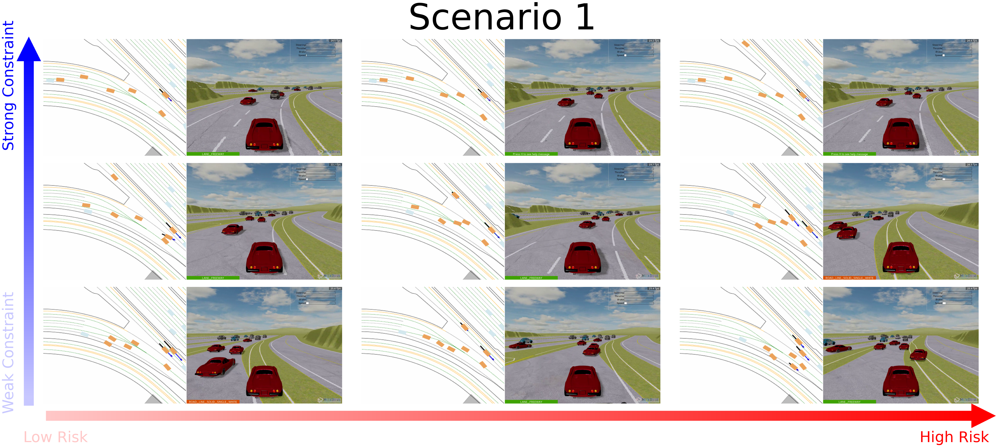

In [35]:
from PIL import ImageDraw, ImageFont, Image
import imageio
import matplotlib.pyplot as plt
import cv2

scenario_id = 1

def draw_gradient_arrow(image, orientation='horizontal', color1=(255, 0, 0), color2=(0, 0, 255), start_pos=(0, 0), length=300, arrow_width=40, arrow_head_size=20):
    draw = ImageDraw.Draw(image)
    if orientation == 'horizontal':
        for i in range(length):
            r = color1[0] + (color2[0] - color1[0]) * i // length
            g = color1[1] + (color2[1] - color1[1]) * i // length
            b = color1[2] + (color2[2] - color1[2]) * i // length
            draw.line([(start_pos[0] + i, start_pos[1]), (start_pos[0] + i, start_pos[1] + arrow_width)], fill=(r, g, b), width=arrow_width)
        # Draw the arrowhead
        arrowhead_pos = (start_pos[0] + length, start_pos[1] + arrow_width // 2)
        draw.polygon([arrowhead_pos, 
                      (arrowhead_pos[0] - arrow_head_size, arrowhead_pos[1] - arrow_head_size), 
                      (arrowhead_pos[0] - arrow_head_size, arrowhead_pos[1] + arrow_head_size)], 
                      fill=color2)
    elif orientation == 'vertical':
        for i in range(length):
            r = color1[0] + (color2[0] - color1[0]) * i // length
            g = color1[1] + (color2[1] - color1[1]) * i // length
            b = color1[2] + (color2[2] - color1[2]) * i // length
            draw.line([(start_pos[0] + arrow_width, start_pos[1] + i), (start_pos[0], start_pos[1] + i)], fill=(r, g, b), width=arrow_width)
        # Draw the arrowhead
        arrowhead_pos = (start_pos[0] + arrow_width // 2, start_pos[1] + length)
        draw.polygon([arrowhead_pos, 
                      (arrowhead_pos[0] - arrow_head_size, arrowhead_pos[1] - arrow_head_size), 
                      (arrowhead_pos[0] + arrow_head_size, arrowhead_pos[1] - arrow_head_size)], 
                      fill=color2)

def get_last_frame_gif(file_path):
    try:
        with imageio.get_reader(file_path) as reader:
            num_frames = reader.get_length()
            last_frame = reader.get_data(num_frames - 1)
            last_frame_image = Image.fromarray(last_frame)
            return last_frame_image
    except EOFError:
        print(f"Error reading the last frame of {file_path}.")
        return None

def get_last_frame_mp4(file_path):
    try:
        cap = cv2.VideoCapture(file_path)
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        cap.set(cv2.CAP_PROP_POS_FRAMES, total_frames - 1)
        ret, frame = cap.read()
        if ret:
            last_frame_image = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            cap.release()
            return last_frame_image
    except Exception as e:
        print(f"Error reading the last frame of {file_path}: {e}")
        return None

def resize_image1(image, size):
    left = 200  # x-coordinate of the left edge of the region
    top = 100   # y-coordinate of the top edge of the region
    right = 600 # x-coordinate of the right edge of the region
    bottom = 450 # y-coordinate of the bottom edge of the region
    image = image.crop((left, top, right, bottom))
    return image.resize(size, resample = Image.BICUBIC)

def resize_image2(image, size):
    return image.resize(size, resample = Image.BICUBIC)

gif_files = ['./waymo_pred/scenario1/scenario1_distance8_quantile56.gif',
             './waymo_pred/scenario1/scenario1_distance8_quantile32.gif',
             './waymo_pred/scenario1/scenario1_distance8_quantile8.gif',
             './waymo_pred/scenario1/scenario1_distance5_quantile56.gif', 
             './waymo_pred/scenario1/scenario1_distance5_quantile32.gif',
             './waymo_pred/scenario1/scenario1_distance5_quantile8.gif', 
             './waymo_pred/scenario1/scenario1_distance2_quantile56.gif',
             './waymo_pred/scenario1/scenario1_distance2_quantile32.gif', 
             './waymo_pred/scenario1/scenario1_distance2_quantile8.gif']

mp4_files = ['./waymo_pred/scenario1/sd_waymo_v1.2_9c6eb32bcc69d42e_scenario1_distance_limit8.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-22_22-13-47/1_interface.mp4',
             './waymo_pred/scenario1/sd_waymo_v1.2_9c6eb32bcc69d42e_scenario1_distance_limit8.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-22_22-11-39/1_interface.mp4',
             './waymo_pred/scenario1/sd_waymo_v1.2_9c6eb32bcc69d42e_scenario1_distance_limit8.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-22_22-11-00/1_interface.mp4',
             './waymo_pred/scenario1/sd_waymo_v1.2_9c6eb32bcc69d42e_scenario1_distance_limit5.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-22_22-12-27/1_interface.mp4',
             './waymo_pred/scenario1/sd_waymo_v1.2_9c6eb32bcc69d42e_scenario1_distance_limit5.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-22_22-11-18/1_interface.mp4',
             './waymo_pred/scenario1/sd_waymo_v1.2_9c6eb32bcc69d42e_scenario1_distance_limit5.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-22_22-11-57/1_interface.mp4',
             './waymo_pred/scenario1/sd_waymo_v1.2_9c6eb32bcc69d42e_scenario1_distance_limit2.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-22_22-14-15/1_interface.mp4',
             './waymo_pred/scenario1/sd_waymo_v1.2_9c6eb32bcc69d42e_scenario1_distance_limit2.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-22_22-13-21/1_interface.mp4',
             './waymo_pred/scenario1/sd_waymo_v1.2_9c6eb32bcc69d42e_scenario1_distance_limit2.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-22_22-12-50/1_interface.mp4']

# gif_files = ['./waymo_pred/scenario2/scenario2_distance5_quantile56.gif',
#              './waymo_pred/scenario2/scenario2_distance5_quantile32.gif',
#              './waymo_pred/scenario2/scenario2_distance5_quantile8.gif',
#              './waymo_pred/scenario2/scenario2_distance3_quantile56.gif',
#              './waymo_pred/scenario2/scenario2_distance3_quantile32.gif',
#              './waymo_pred/scenario2/scenario2_distance3_quantile8.gif',
#              './waymo_pred/scenario2/scenario2_distance2_quantile56.gif',
#              './waymo_pred/scenario2/scenario2_distance2_quantile32.gif',
#              './waymo_pred/scenario2/scenario2_distance2_quantile8.gif']

# mp4_files = ['./waymo_pred/scenario2/sd_waymo_v1.2_2f1be7eedc2c7333_scenario2_distance_limit5.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-21_11-41-55/1_interface.mp4',
#              './waymo_pred/scenario2/sd_waymo_v1.2_2f1be7eedc2c7333_scenario2_distance_limit5.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-21_11-44-16/1_interface.mp4',
#              './waymo_pred/scenario2/sd_waymo_v1.2_2f1be7eedc2c7333_scenario2_distance_limit5.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-21_11-43-22/1_interface.mp4',
#              './waymo_pred/scenario2/sd_waymo_v1.2_2f1be7eedc2c7333_scenario2_distance_limit3.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-21_11-41-28/1_interface.mp4',
#              './waymo_pred/scenario2/sd_waymo_v1.2_2f1be7eedc2c7333_scenario2_distance_limit3.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-21_11-42-24/1_interface.mp4',
#              './waymo_pred/scenario2/sd_waymo_v1.2_2f1be7eedc2c7333_scenario2_distance_limit3.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-21_11-43-49/1_interface.mp4',
#              './waymo_pred/scenario2/sd_waymo_v1.2_2f1be7eedc2c7333_scenario2_distance_limit2.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-21_11-42-52/1_interface.mp4',
#              './waymo_pred/scenario2/sd_waymo_v1.2_2f1be7eedc2c7333_scenario2_distance_limit2.0_penalty_initial_value1.0_cost_quantile32_seed123.pkl_video_2024-08-21_11-41-05/1_interface.mp4',
#              './waymo_pred/scenario2/sd_waymo_v1.2_2f1be7eedc2c7333_scenario2_distance_limit2.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-21_11-40-35/1_interface.mp4']

# gif_files = ['./waymo_pred/scenario3/scenario3_distance8_quantile56.gif', 
#              './waymo_pred/scenario3/scenario3_distance8_quantile32.gif', 
#              './waymo_pred/scenario3/scenario3_distance8_quantile8.gif', 
#              './waymo_pred/scenario3/scenario3_distance5_quantile56.gif', 
#              './waymo_pred/scenario3/scenario3_distance5_quantile32.gif', 
#              './waymo_pred/scenario3/scenario3_distance5_quantile8.gif', 
#              './waymo_pred/scenario3/scenario3_distance2_quantile56.gif', 
#              './waymo_pred/scenario3/scenario3_distance2_quantile32.gif', 
#              './waymo_pred/scenario3/scenario3_distance2_quantile8.gif']

# mp4_files = ['./waymo_pred/scenario3/sd_waymo_v1.2_ab68832bf7312ab3_scenario3_distance_limit8.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-21_11-25-59/1_interface.mp4',
#              './waymo_pred/scenario3/sd_waymo_v1.2_ab68832bf7312ab3_scenario3_distance_limit8.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-21_11-26-37/1_interface.mp4',
#              './waymo_pred/scenario3/sd_waymo_v1.2_ab68832bf7312ab3_scenario3_distance_limit8.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-21_11-27-35/1_interface.mp4',
#              './waymo_pred/scenario3/sd_waymo_v1.2_ab68832bf7312ab3_scenario3_distance_limit5.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-21_11-25-40/1_interface.mp4',
#              './waymo_pred/scenario3/sd_waymo_v1.2_ab68832bf7312ab3_scenario3_distance_limit5.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-21_11-26-17/1_interface.mp4',
#              './waymo_pred/scenario3/sd_waymo_v1.2_ab68832bf7312ab3_scenario3_distance_limit5.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-21_11-27-07/1_interface.mp4',
#              './waymo_pred/scenario3/sd_waymo_v1.2_ab68832bf7312ab3_scenario3_distance_limit2.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-21_11-28-05/1_interface.mp4',
#              './waymo_pred/scenario3/sd_waymo_v1.2_ab68832bf7312ab3_scenario3_distance_limit2.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-21_11-25-13/1_interface.mp4',
#              './waymo_pred/scenario3/sd_waymo_v1.2_ab68832bf7312ab3_scenario3_distance_limit2.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-21_11-24-43/1_interface.mp4']


# gif_files = ['./waymo_pred/scenario4/scenario4_distance5_quantile56.gif',
#              './waymo_pred/scenario4/scenario4_distance5_quantile32.gif',
#              './waymo_pred/scenario4/scenario4_distance5_quantile8.gif',
#              './waymo_pred/scenario4/scenario4_distance3_quantile56.gif',
#              './waymo_pred/scenario4/scenario4_distance3_quantile32.gif',
#              './waymo_pred/scenario4/scenario4_distance3_quantile8.gif',
#              './waymo_pred/scenario4/scenario4_distance2_quantile56.gif',
#              './waymo_pred/scenario4/scenario4_distance2_quantile32.gif',
#              './waymo_pred/scenario4/scenario4_distance2_quantile8.gif']
# mp4_files = ['./waymo_pred/scenario4/sd_waymo_v1.2_63bcffc229444c56_scenario4_distance_limit5.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-21_11-17-48/1_interface.mp4',
#              './waymo_pred/scenario4/sd_waymo_v1.2_63bcffc229444c56_scenario4_distance_limit5.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-21_11-18-10/1_interface.mp4',
#              './waymo_pred/scenario4/sd_waymo_v1.2_63bcffc229444c56_scenario4_distance_limit5.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-21_11-17-00/1_interface.mp4',
#              './waymo_pred/scenario4/sd_waymo_v1.2_63bcffc229444c56_scenario4_distance_limit3.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-21_11-17-27/1_interface.mp4',
#              './waymo_pred/scenario4/sd_waymo_v1.2_63bcffc229444c56_scenario4_distance_limit3.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-21_11-16-15/1_interface.mp4',
#              './waymo_pred/scenario4/sd_waymo_v1.2_63bcffc229444c56_scenario4_distance_limit3.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-21_11-15-03/1_interface.mp4',
#              './waymo_pred/scenario4/sd_waymo_v1.2_63bcffc229444c56_scenario4_distance_limit2.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-21_11-16-38/1_interface.mp4',
#              './waymo_pred/scenario4/sd_waymo_v1.2_63bcffc229444c56_scenario4_distance_limit2.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-21_11-15-28/1_interface.mp4',
#              './waymo_pred/scenario4/sd_waymo_v1.2_63bcffc229444c56_scenario4_distance_limit2.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-21_11-15-52/1_interface.mp4']


# gif_files = ['./waymo_pred/scenario5/scenario5_distance5_quantile56.gif',
#              './waymo_pred/scenario5/scenario5_distance5_quantile32.gif',
#              './waymo_pred/scenario5/scenario5_distance5_quantile8.gif',
#              './waymo_pred/scenario5/scenario5_distance3_quantile56.gif',
#              './waymo_pred/scenario5/scenario5_distance3_quantile32.gif',
#              './waymo_pred/scenario5/scenario5_distance3_quantile8.gif',
#              './waymo_pred/scenario5/scenario5_distance2_quantile56.gif',
#              './waymo_pred/scenario5/scenario5_distance2_quantile32.gif',
#              './waymo_pred/scenario5/scenario5_distance2_quantile8.gif']
# mp4_files = ['./waymo_pred/scenario5/sd_waymo_v1.2_caea26e357c20bfc_scenario5_distance_limit5.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-22_17-47-01/1_interface.mp4',
#              './waymo_pred/scenario5/sd_waymo_v1.2_caea26e357c20bfc_scenario5_distance_limit5.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-22_17-47-21/1_interface.mp4',
#              './waymo_pred/scenario5/sd_waymo_v1.2_caea26e357c20bfc_scenario5_distance_limit5.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-22_17-48-55/1_interface.mp4',
#              './waymo_pred/scenario5/sd_waymo_v1.2_caea26e357c20bfc_scenario5_distance_limit3.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-22_17-48-05/1_interface.mp4',
#              './waymo_pred/scenario5/sd_waymo_v1.2_caea26e357c20bfc_scenario5_distance_limit3.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-22_17-47-41/1_interface.mp4',
#              './waymo_pred/scenario5/sd_waymo_v1.2_caea26e357c20bfc_scenario5_distance_limit3.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-22_17-46-10/1_interface.mp4',
#              './waymo_pred/scenario5/sd_waymo_v1.2_caea26e357c20bfc_scenario5_distance_limit2.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-22_17-48-29/1_interface.mp4',
#              './waymo_pred/scenario5/sd_waymo_v1.2_caea26e357c20bfc_scenario5_distance_limit2.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-22_17-49-23/1_interface.mp4',
#              './waymo_pred/scenario5/sd_waymo_v1.2_caea26e357c20bfc_scenario5_distance_limit2.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-22_17-46-35/1_interface.mp4']

# gif_files = ['./waymo_pred/scenario6/scenario6_distance5_quantile56.gif',
#              './waymo_pred/scenario6/scenario6_distance5_quantile32.gif',
#              './waymo_pred/scenario6/scenario6_distance5_quantile8.gif',
#              './waymo_pred/scenario6/scenario6_distance3_quantile56.gif',
#              './waymo_pred/scenario6/scenario6_distance3_quantile32.gif',
#              './waymo_pred/scenario6/scenario6_distance3_quantile8.gif',
#              './waymo_pred/scenario6/scenario6_distance2_quantile56.gif',
#              './waymo_pred/scenario6/scenario6_distance2_quantile32.gif',
#              './waymo_pred/scenario6/scenario6_distance2_quantile8.gif']
# mp4_files = ['./waymo_pred/scenario6/sd_waymo_v1.2_5d0c97b991689cde_scenario6_distance_limit5.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-21_11-32-23/1_interface.mp4',
#              './waymo_pred/scenario6/sd_waymo_v1.2_5d0c97b991689cde_scenario6_distance_limit5.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-21_11-31-39/1_interface.mp4',
#              './waymo_pred/scenario6/sd_waymo_v1.2_5d0c97b991689cde_scenario6_distance_limit5.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-21_11-33-47/1_interface.mp4',
#              './waymo_pred/scenario6/sd_waymo_v1.2_5d0c97b991689cde_scenario6_distance_limit3.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-21_11-33-27/1_interface.mp4',
#              './waymo_pred/scenario6/sd_waymo_v1.2_5d0c97b991689cde_scenario6_distance_limit3.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-21_11-32-45/1_interface.mp4',
#              './waymo_pred/scenario6/sd_waymo_v1.2_5d0c97b991689cde_scenario6_distance_limit3.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-21_11-34-06/1_interface.mp4',
#              './waymo_pred/scenario6/sd_waymo_v1.2_5d0c97b991689cde_scenario6_distance_limit2.0_penalty_initial_value1.0_cost_quantile56.pkl_video_2024-08-21_11-34-24/1_interface.mp4',
#              './waymo_pred/scenario6/sd_waymo_v1.2_5d0c97b991689cde_scenario6_distance_limit2.0_penalty_initial_value1.0_cost_quantile32.pkl_video_2024-08-21_11-33-09/1_interface.mp4',
#              './waymo_pred/scenario6/sd_waymo_v1.2_5d0c97b991689cde_scenario6_distance_limit2.0_penalty_initial_value1.0_cost_quantile8.pkl_video_2024-08-21_11-32-04/1_interface.mp4']


gif_images = [get_last_frame_gif(file) for file in gif_files]
mp4_images = [get_last_frame_mp4(file) for file in mp4_files]

if len(gif_images) != 9 or len(mp4_images) != 9:
    print("Error: Not all images could be loaded.")
else:
    new_size = (min(img.size[0] for img in gif_images + mp4_images), min(img.size[1] for img in gif_images + mp4_images))
    gif_images = [resize_image1(img, new_size) for img in gif_images]
    mp4_images = [resize_image2(img, new_size) for img in mp4_images]

    spacing = 30

    single_width, single_height = new_size
    total_width = single_width * 2 + spacing
    total_height = single_height + spacing
    combined_images = []

    for gif_img, mp4_img in zip(gif_images, mp4_images):
        combined_image = Image.new('RGB', (total_width, single_height), (255, 255, 255))
        combined_image.paste(gif_img, (0, 0))
        combined_image.paste(mp4_img, (single_width-spacing-20, 0))
        combined_images.append(combined_image)

    final_image = Image.new('RGB', (total_width * 3, total_height * 3), (255, 255, 255))

    for idx, img in enumerate(combined_images):
        x_offset = (idx % 3) * total_width
        y_offset = (idx // 3) * total_height
        final_image.paste(img, (x_offset, y_offset))

    # Add padding for arrows and labels
    padding_top = 10
    padding_side = 150
    padding_bottom = 70  # Extra space at the bottom for the red gradient arrow
    new_size = (final_image.width + padding_side, final_image.height + padding_top + padding_bottom)
    padded_image = Image.new("RGB", new_size, (255, 255, 255))
    padded_image.paste(final_image, (padding_side, padding_top))
    draw = ImageDraw.Draw(padded_image)

    # Draw the arrows and labels on the padded image
    draw_gradient_arrow(padded_image, orientation='horizontal', color1=(255, 200, 200), color2=(255, 0, 0), start_pos=(padding_side+30, new_size[1] - 70), length=final_image.width-100, arrow_width=40)
    draw_gradient_arrow(padded_image, orientation='vertical', color1=(0, 0, 255), color2=(200, 200, 255), start_pos=(70, padding_top+60), length=final_image.height-100, arrow_width=40)
    
    # Add triangles at the ends of the gradients
    triangle_size = 100

    # Triangle on the right end of the horizontal arrow
    right_triangle = [(4170-100, 1510+50),  # Tip
                    (4170 - triangle_size-100, 1510),  # Bottom corner
                    (4170 - triangle_size-100, 1510 + 100)]  # Top corner
    draw.polygon(right_triangle, fill=(255, 0, 0))

    # Triangle on the top end of the vertical arrow
    top_triangle = [(90, 0),  # Tip
                    (40, 0 + triangle_size),  # Left corner
                    (140, 0 + triangle_size)]  # Right corner
    draw.polygon(top_triangle, fill=(0, 0, 255))
    # Display the image
    plt.figure(figsize=(60, 60))
    plt.imshow(padded_image)

    plt.axis('off')
    # Add text labels using plt.text
    plt.text(200,1650, "Low Risk", fontsize=50, color=(255 / 255, 200 / 255, 200 / 255), ha='center', va='center')
    plt.text(3900,1650, "High Risk", fontsize=50, color=(255 / 255, 0 / 255, 0 / 255), ha='center', va='center')
    plt.text(10,1300, "Weak Constraint", fontsize=50, color=(200 / 255, 200 / 255, 255 / 255), ha='center', va='center', rotation='vertical')
    plt.text(10, 200,"Strong Constraint", fontsize=50, color=(0 / 255, 0 / 255, 255 / 255), ha='center', va='center', rotation='vertical')
    plt.title(f'Scenario {scenario_id}', fontsize=120)

In [ ]:
import os
import numpy as np
import pickle
import pandas as pd
from pathlib import Path
from scipy.stats import entropy, wasserstein_distance
from concurrent.futures import ProcessPoolExecutor
import matplotlib.pyplot as plt

def cal_Hellinger_dis(P, Q):
    """
    Calculate the Hellinger distance for two distribution
    """
    # Convert into probability first
    P = P/np.sum(P)
    Q = Q/np.sum(Q)

    H_dist = (1 / np.sqrt(2)) * np.linalg.norm(np.abs(np.sqrt(P) - np.sqrt(Q)))
    return H_dist


def cal_KL_div(P, Q):
    """
    Calculate the KL-divergence for two distribution
    sum(P(x) * log (P(x)/Q(x)))
    """
    # Convert into probability first
    P = P/np.sum(P)
    Q = Q/np.sum(Q)

    KL_div = entropy(pk=P, qk=Q, base=None, axis=0)
    return KL_div

def cal_wasserstein_distance(P, Q):
    P = P/np.sum(P)
    Q = Q/np.sum(Q)
    return wasserstein_distance(P, Q)

def filter_data(df):
    df = df[(df['position_x'] != 0) | (df['position_y'] != 0) ]
    return df

def read_pickle_file(base_dir, file):
    scenarionet_pkl = f'sd_waymo_v1.2_{file}.pkl'
    df_mapping = pd.read_pickle('./scenarionet/datasets/way_convert/dataset_mapping.pkl')
    pkl_loc = df_mapping[scenarionet_pkl]
    df = pd.read_pickle(f'./scenarionet/datasets/way_convert/{pkl_loc}/{scenarionet_pkl}')
    extracted_data = []
    count = 0
    for track_id in list(df['tracks'].keys()):
        if df['tracks'][track_id]['type']=='VEHICLE':
            pos = df['tracks'][track_id]['state']['position']
            vel = df['tracks'][track_id]['state']['velocity']
            valid = df['tracks'][track_id]['state']['valid']
            if valid[:11].sum()!=11:
                valid = np.zeros(91,)
            else:
                valid = np.ones(91,)
            if valid[0]==1:
                count = 0
                for i in range(91):
                    pos_x = pos[i,0]
                    pos_y = pos[i,1]
                    vel_x = vel[i,0]
                    vel_y = vel[i,1]
                    extracted_data.append({'id': track_id, 'position_x': pos_x, 'position_y': pos_y, 'velocity_x': vel_x, 'velocity_y': vel_y,'timestep': count})
                    count+=1
    return pd.DataFrame(extracted_data)

def read_pickle_file_trafficgamer(base_dir, file):
    with open(os.path.join(base_dir, f'{file}_trafficgamer.pkl'), 'rb') as f:
        df = pickle.load(f)
        extracted_data = []
    
        for track_id in list(df['tracks'].keys()):
            if df['tracks'][track_id]['type']=='VEHICLE':
                pos = df['tracks'][track_id]['state']['position']
                vel = df['tracks'][track_id]['state']['velocity']
                valid = df['tracks'][track_id]['state']['valid']
                total_distance = 0
                if valid[:11].sum()!=11:
                    valid = np.zeros(91,)
                else:
                    valid = np.ones(91,)
                if valid[0]==1:
                    count = 0
                    for i in range(91):
                        pos_x = pos[i,0]
                        pos_y = pos[i,1]
                        vel_x = vel[i,0]
                        vel_y = vel[i,1]
                        extracted_data.append({'id': track_id, 'position_x': pos_x, 'position_y': pos_y, 'velocity_x': vel_x, 'velocity_y': vel_y,'timestep': count})
                        count+=1
        return pd.DataFrame(extracted_data)

# file_list = ['d1f6b01e-3b4a-4790-88ed-6d85fb1c0b84', '00a50e9f-63a1-4678-a4fe-c6109721ecba', 
#              '236df665-eec6-4c25-8822-950a6150eade', 'cb0133ff-f7ad-43b7-b260-7068ace15307', 
#              'cdf70cc8-d13d-470b-bb39-4f1812acc146', '3856ed37-4a05-4131-9b12-c4f4716fec92']

# argoverse_scenario_dir = Path("~/Multi-agent-competitive-environment/datasets/val/raw")
# trafficgamer_dir = Path("./argoverse2_pred")

# with ProcessPoolExecutor() as executor:
#     df_list = list(executor.map(read_parquet_file, [argoverse_scenario_dir] * len(file_list), file_list))
#     lengths = [len(df) for df in df_list]
#     df2_list = [read_parquet_file_trafficgamer(trafficgamer_dir, file, idx, length) for idx, (file, length) in enumerate(zip(file_list, lengths))]

file_list = [
        '9c6eb32bcc69d42e',
        '2f1be7eedc2c7333',
        'ab68832bf7312ab3',
        '63bcffc229444c56',
        'caea26e357c20bfc',
        '5d0c97b991689cde'
]

ground_truth = Path("./waymo_pred")
generated = Path("./waymo_pred")

indices = [0,1,2, 3, 4,5]  # Custom indices

with ProcessPoolExecutor() as executor:
    df_list = list(executor.map(read_pickle_file, [ground_truth] * len(file_list), file_list))

    df2_list = [read_pickle_file_trafficgamer(generated, file) for file in file_list]
    df2_list = [filter_data(df) for df in df2_list]

df = pd.concat(df_list, ignore_index=True)
df2 = pd.concat(df2_list, ignore_index=True)

def compute_distances(df):
    distances = []
    timesteps = df['timestep'].unique()
    
    for timestep in timesteps:
        current_positions = df[df['timestep'] == timestep][['position_x', 'position_y']].values
        dist_matrix = np.sqrt(np.sum((current_positions[:, np.newaxis, :] - current_positions[np.newaxis, :, :]) ** 2, axis=-1))
        valid_distances = dist_matrix[(dist_matrix <= 60) & (dist_matrix >= 0)]
        distances.extend(valid_distances)
    
    return np.array(distances)

distances = compute_distances(df)
distances2 = compute_distances(df2)

df = pd.DataFrame(distances, columns=['distance'])
df2 = pd.DataFrame(distances2, columns=['distance'])


bins = np.linspace(0, 15.2, 100)

gt_prob_density, gt_bins, _ = axes[0].hist(df['distance'], bins, density=True, alpha=0.5,edgecolor='k', color='blue', label='Ground-Truth')
trafficgamer_prob_density, trafficgamer_bins, _ = axes[0].hist(df2['distance'], bins, density=True, edgecolor='k',alpha=0.5, color='orange', label='TrafficGamer')


kl_divergence = cal_KL_div(gt_prob_density, trafficgamer_prob_density)
hellinger_dist = cal_Hellinger_dis(gt_prob_density, trafficgamer_prob_density)
wasserstein_dist = cal_wasserstein_distance(gt_prob_density, trafficgamer_prob_density)

axes[0].text(10, 0.2, f'$D_H: {hellinger_dist:.4f}$', size=48)
axes[0].text(10, 0.15, f'$D_{{KL}}: {kl_divergence:.4f}$', size=48)
axes[0].text(10, 0.1, f'$D_W: {wasserstein_dist:.4f}$', size=48)


axes[0].legend(fontsize=36)
# axes[1].legend(fontsize=36)
axes[0].set_title('Vehicle Distance Distribution (all scenarios)', fontsize=48)


file_list = [
        '9c6eb32bcc69d42e',
        '2f1be7eedc2c7333',
        'ab68832bf7312ab3',
        '63bcffc229444c56',
        'caea26e357c20bfc',
        '5d0c97b991689cde'
]

ground_truth = Path("./waymo_pred")
generated = Path("./waymo_pred")

indices = [0,1,2, 3, 4,5]  # Custom indices

with ProcessPoolExecutor() as executor:
    df_list = list(executor.map(read_pickle_file, [ground_truth] * len(file_list), file_list))

    df2_list = [read_pickle_file_trafficgamer(generated, file) for file in file_list]
    df2_list = [filter_data(df) for df in df2_list]

df = pd.concat(df_list, ignore_index=True)
df2 = pd.concat(df2_list, ignore_index=True)

def compute_distances(df):
    distances = []
    timesteps = df['timestep'].unique()
    
    for timestep in timesteps:
        current_positions = df[df['timestep'] == timestep][['position_x', 'position_y']].values
        dist_matrix = np.sqrt(np.sum((current_positions[:, np.newaxis, :] - current_positions[np.newaxis, :, :]) ** 2, axis=-1))
        valid_distances = dist_matrix[(dist_matrix <= 60) & (dist_matrix >= 0.2)]
        distances.extend(valid_distances)
    
    return np.array(distances)

# distances = compute_distances(df)
# distances2 = compute_distances(df2)

df['speed'] = np.sqrt(df['velocity_x']**2 + df['velocity_y']**2)
df2['speed'] = np.sqrt(df2['velocity_x']**2 + df2['velocity_y']**2)

df = df.loc[df['speed'] > 0.5]
df2 = df2.loc[df2['speed'] > 0.5]
# df = pd.DataFrame(distances, columns=['velocity'])
# df2 = pd.DataFrame(distances2, columns=['velocity'])

fig, axes = plt.subplots(1, 3, figsize=(60, 12))


bins = np.linspace(0, 15.2, 100)

gt_prob_density, gt_bins, _ = axes[0].hist(df['speed'], bins, density=True, alpha=0.5,edgecolor='k', color='blue', label='Ground-Truth')
trafficgamer_prob_density, trafficgamer_bins, _ = axes[0].hist(df2['speed'], bins, density=True, edgecolor='k',alpha=0.5, color='orange', label='TrafficGamer')


kl_divergence = cal_KL_div(gt_prob_density, trafficgamer_prob_density)
hellinger_dist = cal_Hellinger_dis(gt_prob_density, trafficgamer_prob_density)
wasserstein_dist = cal_wasserstein_distance(gt_prob_density, trafficgamer_prob_density)

axes[0].text(10, 0.15, f'$D_H: {hellinger_dist:.4f}$', size=48)
axes[0].text(10, 0.12, f'$D_{{KL}}: {kl_divergence:.4f}$', size=48)
axes[0].text(10, 0.09, f'$D_W: {wasserstein_dist:.4f}$', size=48)

file_list = [
        '2f1be7eedc2c7333',
        '63bcffc229444c56',
        'caea26e357c20bfc'
]

with ProcessPoolExecutor() as executor:
    df_list = list(executor.map(read_pickle_file, [ground_truth] * len(file_list), file_list))

    df2_list = [read_pickle_file_trafficgamer(generated, file) for file in file_list]
    df2_list = [filter_data(df) for df in df2_list]

df = pd.concat(df_list, ignore_index=True)
df2 = pd.concat(df2_list, ignore_index=True)

def compute_distances(df):
    distances = []
    timesteps = df['timestep'].unique()
    
    for timestep in timesteps:
        current_positions = df[df['timestep'] == timestep][['position_x', 'position_y']].values
        dist_matrix = np.sqrt(np.sum((current_positions[:, np.newaxis, :] - current_positions[np.newaxis, :, :]) ** 2, axis=-1))
        valid_distances = dist_matrix[(dist_matrix <= 60) & (dist_matrix >= 0.2)]
        distances.extend(valid_distances)
    
    return np.array(distances)

# distances = compute_distances(df)
# distances2 = compute_distances(df2)

# df = pd.DataFrame(distances, columns=['velocity'])
# df2 = pd.DataFrame(distances2, columns=['velocity'])
df['speed'] = np.sqrt(df['velocity_x']**2 + df['velocity_y']**2)
df2['speed'] = np.sqrt(df2['velocity_x']**2 + df2['velocity_y']**2)

df = df.loc[df['speed'] > 0.5]
df2 = df2.loc[df2['speed'] > 0.5]


bins = np.linspace(0, 15.2, 100)

gt_prob_density, gt_bins, _ = axes[1].hist(df['speed'], bins, density=True, alpha=0.5,edgecolor='k', color='blue', label='Ground-Truth')
trafficgamer_prob_density, trafficgamer_bins, _ = axes[1].hist(df2['speed'], bins, density=True, edgecolor='k',alpha=0.5, color='orange', label='TrafficGamer')


kl_divergence = cal_KL_div(gt_prob_density, trafficgamer_prob_density)
hellinger_dist = cal_Hellinger_dis(gt_prob_density, trafficgamer_prob_density)
wasserstein_dist = cal_wasserstein_distance(gt_prob_density, trafficgamer_prob_density)

axes[1].text(10, 0.2, f'$D_H: {hellinger_dist:.4f}$', size=48)
axes[1].text(10, 0.15, f'$D_{{KL}}: {kl_divergence:.4f}$', size=48)
axes[1].text(10, 0.1, f'$D_W: {wasserstein_dist:.4f}$', size=48)

file_list = [
        '9c6eb32bcc69d42e',
        'ab68832bf7312ab3',
        '5d0c97b991689cde'
]

with ProcessPoolExecutor() as executor:
    df_list = list(executor.map(read_pickle_file, [ground_truth] * len(file_list), file_list))

    df2_list = [read_pickle_file_trafficgamer(generated, file) for file in file_list]
    df2_list = [filter_data(df) for df in df2_list]

df = pd.concat(df_list, ignore_index=True)
df2 = pd.concat(df2_list, ignore_index=True)

def compute_distances(df):
    distances = []
    timesteps = df['timestep'].unique()
    
    for timestep in timesteps:
        current_positions = df[df['timestep'] == timestep][['position_x', 'position_y']].values
        dist_matrix = np.sqrt(np.sum((current_positions[:, np.newaxis, :] - current_positions[np.newaxis, :, :]) ** 2, axis=-1))
        valid_distances = dist_matrix[(dist_matrix <= 60) & (dist_matrix >= 0.2)]
        distances.extend(valid_distances)
    
    return np.array(distances)

# distances = compute_distances(df)
# distances2 = compute_distances(df2)

# df = pd.DataFrame(distances, columns=['velocity'])
# df2 = pd.DataFrame(distances2, columns=['velocity'])

df['speed'] = np.sqrt(df['velocity_x']**2 + df['velocity_y']**2)
df2['speed'] = np.sqrt(df2['velocity_x']**2 + df2['velocity_y']**2)

df = df.loc[df['speed'] > 0.5]
df2 = df2.loc[df2['speed'] > 0.5]


bins = np.linspace(0, 15.2, 100)

gt_prob_density, gt_bins, _ = axes[2].hist(df['speed'], bins, density=True, alpha=0.5,edgecolor='k', color='blue', label='Ground-Truth')
trafficgamer_prob_density, trafficgamer_bins, _ = axes[2].hist(df2['speed'], bins, density=True, edgecolor='k',alpha=0.5, color='orange', label='TrafficGamer')


kl_divergence = cal_KL_div(gt_prob_density, trafficgamer_prob_density)
hellinger_dist = cal_Hellinger_dis(gt_prob_density, trafficgamer_prob_density)
wasserstein_dist = cal_wasserstein_distance(gt_prob_density, trafficgamer_prob_density)

axes[2].text(10, 0.15, f'$D_H: {hellinger_dist:.4f}$', size=48)
axes[2].text(10, 0.12, f'$D_{{KL}}: {kl_divergence:.4f}$', size=48)
axes[2].text(10, 0.09, f'$D_W: {wasserstein_dist:.4f}$', size=48)


axes[0].legend(fontsize=36)
axes[1].legend(fontsize=36)
axes[2].legend(fontsize=36)
axes[0].set_title('Vehicle Velocity Distribution (all scenarios)', fontsize=48)
axes[1].set_title('Vehicle Velocity Distribution (cross road)', fontsize=48)
axes[2].set_title('Vehicle Velocity Distribution (fork road)', fontsize=48)

for ax in axes:
    ax.tick_params(axis='both', labelsize=36)

axes[0].set_ylabel('Probability Density', fontsize=48)
fig.supxlabel('velocity (m/s)', fontsize=48)
plt.tight_layout(rect=[0, 0, 0, 0.85])
plt.show()